<a href="https://colab.research.google.com/github/watch-raider/Deep-Network-Development/blob/main/DND_Object_Detection_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Import libraries and check the system

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 5.0 MB/s eta 0:00:00


In [ ]:
from zipfile import ZipFile
import os

import ultralytics
ultralytics.checks()

from ultralytics import YOLO
import torch
from PIL import Image  # to display images
print(f"Setup complete. Using torch {torch.__version__} on device ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.9/78.2 GB disk)
Setup complete. Using torch 2.1.0+cu118 on device (Tesla V100-SXM2-16GB)


Download 100-image dataset.

number of classes: 1

class name: cigar

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

path = '/content/drive/My Drive/Masters/ELTE/DND/Object Detection'

Mounted at /content/drive


In [ ]:
zip = ZipFile(f'{path}/data.zip')
zip.extractall()

Create a summary file with the locations and class names

In [ ]:
#generate yaml file to point to training and validation images paths
path_train = 'data/images/train'
path_val = 'data/images/val'

with open('./config.yaml', 'w') as f:

        f.write(f"train: /content/{path_train} \nval: /content/{path_val} \n")
        #f.write("nc: 80 \n")
        f.write("names:\n  0: cigar")
        f.write('\n')
f.close()

Train a YOLOv8 model on the COCO128 dataset with --datasets test.yaml, starting from pretrained yolov8n.pt

In [ ]:
# Load a model
model = YOLO(f"{path}/yolov8n.pt", )  # load a pretrained model
#model = YOLO(f"{path}/best.pt", )  # load a pretrained model with optimised weights after tuning
model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [ ]:
from ultralytics.models.yolo import detect

batch_size = 25
epoch_count = 30
early_stopping = 20
optimiser = 'SGD'
is_pretrained = True
image_size = 640

# use model in training mode
results = model.train(cfg=f'{path}/best_hyperparameters.yaml', data='config.yaml', epochs=epoch_count, patience=early_stopping, batch=batch_size, optimizer=optimiser, pretrained=is_pretrained, imgsz=image_size)

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=None, data=config.yaml, epochs=30, patience=20, batch=25, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False

100%|██████████| 755k/755k [00:00<00:00, 15.9MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 77.9MB/s]


AMP: checks passed ✅


train: Scanning /content/data/labels/train... 80 images, 0 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<00:00, 1591.80it/s]

train: New cache created: /content/data/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/data/labels/val... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<00:00, 925.97it/s]

val: New cache created: /content/data/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: SGD(lr=0.01067, momentum=0.92749) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.00043359374999999995), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      3.56G      1.216      4.302       1.36          5        640: 100%|██████████| 4/4 [00:30<00:00,  7.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.99s/it]

                   all         20         28      0.002      0.429    0.00318    0.00199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      3.59G      1.178      4.001      1.346          5        640: 100%|██████████| 4/4 [00:12<00:00,  3.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all         20         28    0.00233        0.5    0.00309    0.00181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      3.57G      1.096      3.938      1.257          5        640: 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all         20         28     0.0025      0.536     0.0036    0.00225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      3.57G      1.169      3.984      1.285          5        640: 100%|██████████| 4/4 [00:03<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         20         28     0.0025      0.536     0.0154    0.00738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       3.6G      1.033      3.476      1.231          8        640: 100%|██████████| 4/4 [00:06<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         20         28      0.003      0.643     0.0422     0.0318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      3.57G      1.154      3.251      1.299          5        640: 100%|██████████| 4/4 [00:03<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         20         28    0.00317      0.679     0.0582     0.0413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       3.6G      1.066      2.686      1.167          6        640: 100%|██████████| 4/4 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         20         28     0.0035       0.75      0.184     0.0925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      3.57G      1.044      2.184      1.282          6        640: 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.25s/it]

                   all         20         28     0.0035       0.75      0.182      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       3.6G      1.057      2.092      1.199          7        640: 100%|██████████| 4/4 [00:01<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all         20         28    0.00333      0.714      0.175     0.0874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      3.57G      1.171      2.121      1.277         13        640: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.76s/it]

                   all         20         28    0.00419      0.429      0.122     0.0822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      3.57G     0.9632      1.909      1.065          5        640: 100%|██████████| 4/4 [00:01<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         20         28    0.00317      0.679      0.137     0.0931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       3.6G      1.044       1.83      1.193          7        640: 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.93s/it]

                   all         20         28          1     0.0616       0.17      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      3.57G      1.025      1.822      1.065          5        640: 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

                   all         20         28          1      0.064      0.191      0.088



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       3.6G     0.9058      1.782      1.055          5        640: 100%|██████████| 4/4 [00:02<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.32s/it]

                   all         20         28      0.924      0.107      0.187      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30       3.6G      1.063        1.8      1.135          5        640: 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         20         28      0.754      0.107      0.169      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       3.6G     0.9437       1.42       1.03          5        640: 100%|██████████| 4/4 [00:03<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  6.00s/it]

                   all         20         28      0.715     0.0923      0.175      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       3.6G     0.9403      1.462      1.097          8        640: 100%|██████████| 4/4 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         20         28      0.546       0.13      0.181      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      3.57G     0.9309      1.402      1.087         12        640: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.18s/it]

                   all         20         28      0.545      0.172      0.174      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       3.6G      1.101      1.397      1.124          6        640: 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         20         28      0.439      0.143      0.208      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      3.61G     0.8931      1.247      1.022         10        640: 100%|██████████| 4/4 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.44s/it]

                   all         20         28      0.765      0.118      0.329      0.159


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      3.57G     0.9828      1.354      1.061          5        640: 100%|██████████| 4/4 [00:39<00:00,  9.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         20         28      0.795       0.14      0.346      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      3.57G     0.9863      1.333      1.044          8        640: 100%|██████████| 4/4 [00:12<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         20         28      0.662      0.179      0.374      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      3.57G     0.8212       1.15      1.013          5        640: 100%|██████████| 4/4 [00:08<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         20         28      0.467      0.214      0.327      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      3.57G     0.9541      1.275      1.014          5        640: 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         20         28      0.478      0.214      0.313      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      3.59G     0.8797      1.163      1.152         10        640: 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

                   all         20         28      0.446       0.25      0.343      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30       3.6G      1.006      1.199      1.068          5        640: 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         20         28      0.386       0.27      0.348      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      3.58G     0.8295      1.055      1.016          5        640: 100%|██████████| 4/4 [00:03<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]

                   all         20         28      0.399      0.321      0.376      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      3.61G     0.8061      1.007     0.9592         11        640: 100%|██████████| 4/4 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.99s/it]

                   all         20         28      0.551        0.5      0.423      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      3.57G     0.7495       1.06     0.9838          5        640: 100%|██████████| 4/4 [00:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.31s/it]

                   all         20         28      0.578      0.536      0.487      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      3.59G     0.9192      1.195      1.195         10        640: 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.54s/it]

                   all         20         28      0.615      0.536      0.495      0.208



30 epochs completed in 0.083 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


                   all         20         28      0.611      0.536      0.502      0.211
Speed: 0.2ms preprocess, 1.2ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train


Validating a YOLOv8 model after it has been trained. Evaluate on a validation set to measure its accuracy and generalization performance

In [ ]:
# evaluate model performance on the validation set
metrics = model.val()

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/data/labels/val.cache... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:18<00:00, 18.63s/it]


                   all         20         28      0.615      0.536      0.496      0.208
Speed: 0.2ms preprocess, 9.6ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train2


In [ ]:
# Hyperparameter tuning aimed at optimizing the machine learning model's performance metrics, such as accuracy, precision, and recall
# model.tune(data='config.yaml', epochs=30, iterations=50, optimizer='SGD', plots=False, save=False, val=False)

Predict

In [ ]:
# Preforming predictions against images taken with my personal phone
# from PIL
im1 = Image.open("data/images/val/IMG-20231115-WA0029.jpg")
im2 = Image.open("data/images/val/IMG-20231116-WA0002.jpg")

# from list of PIL/ndarray
results = model.predict(source=[im1, im2])


0: 640x640 1 cigar, 1: 640x640 (no detections), 181.8ms
Speed: 11.5ms preprocess, 90.9ms inference, 11.0ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
for r in results:
    im_array = r.cpu().numpy().plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    im.show()  # show image

Visualise

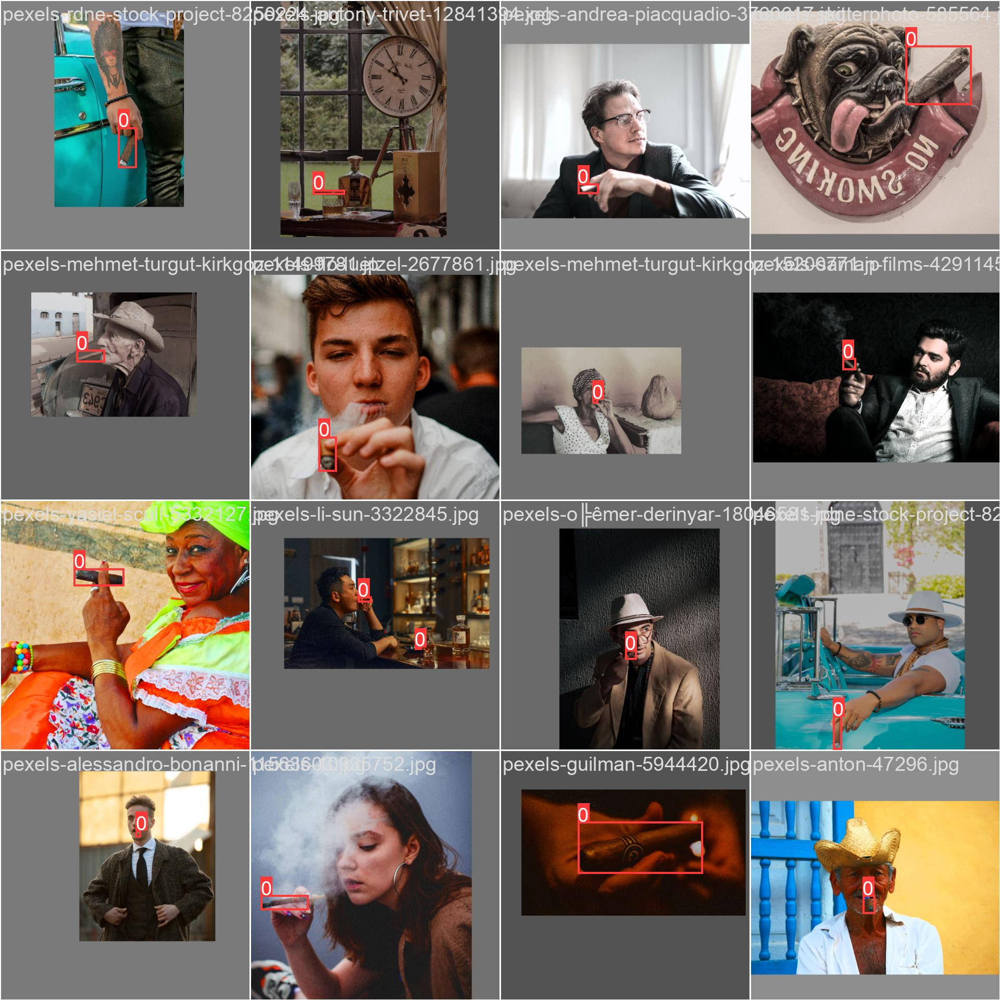

In [ ]:
Image.open(r"runs/detect/train/train_batch0.jpg")

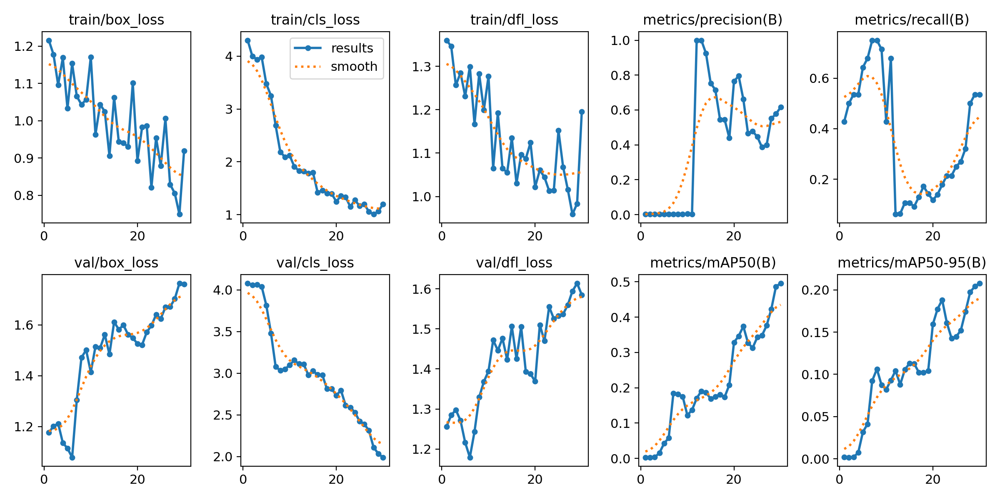

In [ ]:
Image.open(r'runs/detect/train/results.png')

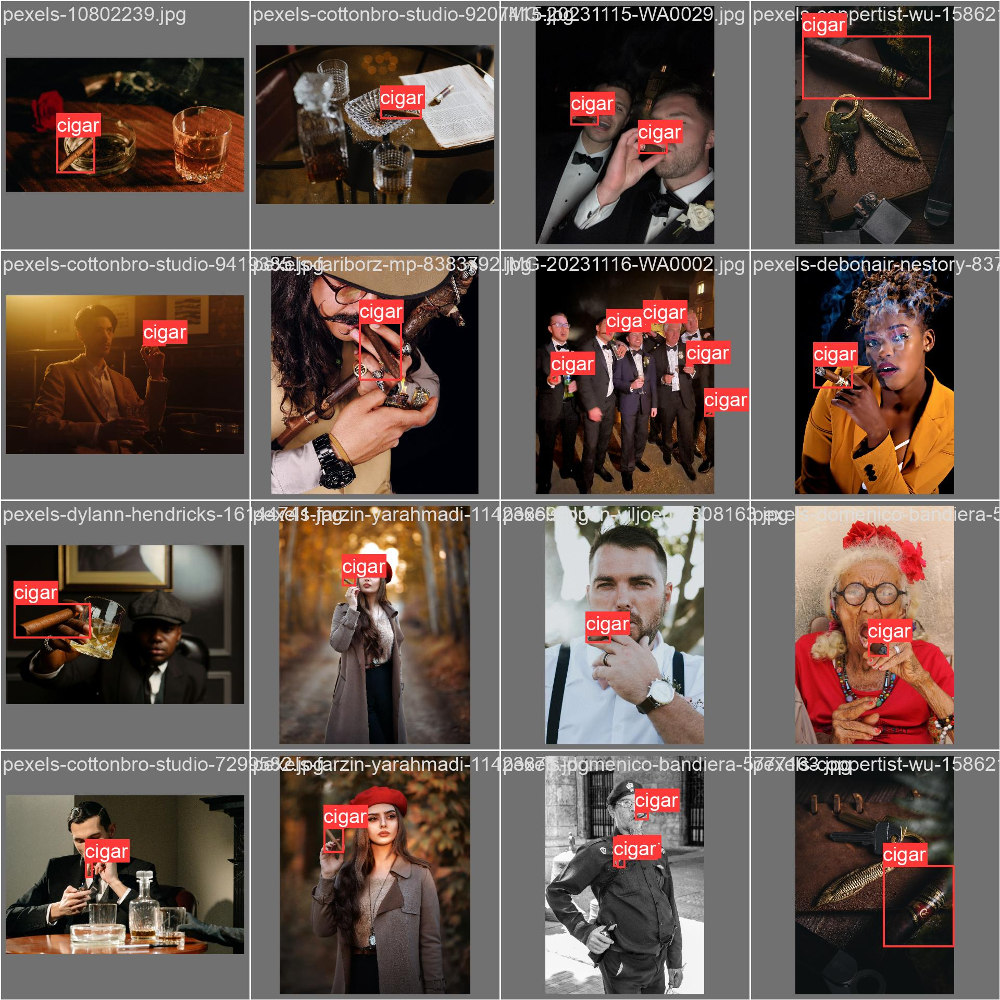

In [ ]:
Image.open(r'runs/detect/train/val_batch0_labels.jpg')

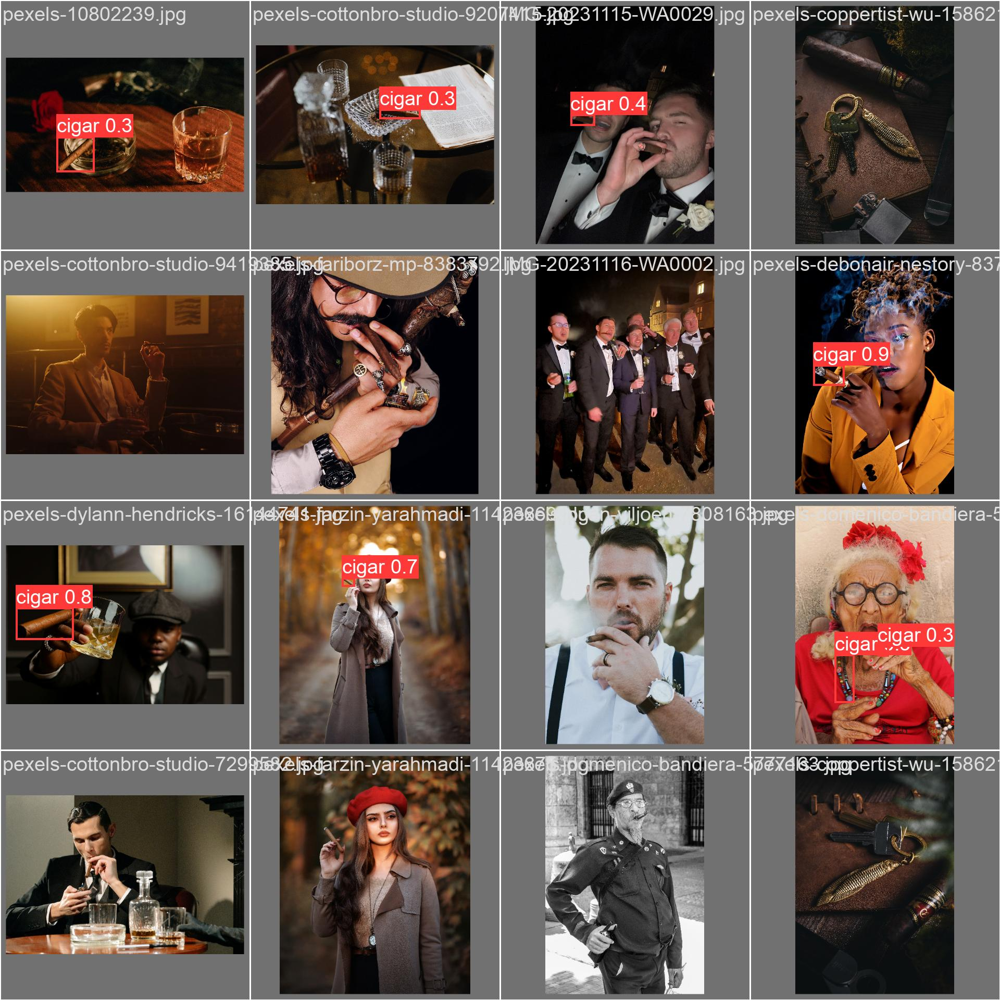

In [ ]:
Image.open(r'runs/detect/train/val_batch0_pred.jpg')

**Summary**


Data Collection

Images were collected from web search where I tried to collate a diverse dataset of cigar images including close-up pictures, pictures with different number of cigars and even photos I had taken with my own phone which I included in the validation. I was more interested in testing the performance of the model my own photos as these were not professionally taken and were in a real life setting.

Metrics

The main metrics I used to evaluate the models performance was Mean Average Precision (mAP), Precision, Recall and the loss function. I also used visualistion on the validation set to assess performance.

Methodology

After collecting my dataset, I trained the trained the pre-trained YoloV8n model on it. I was originally training on 30 epochs and experimented with different parameters. I would the validate the model against the validation set after training. After initial training using the default parameters, the loss function was performing as expected with the error reducing as the model iterated through training but the model was acheiving suboptimal mAP of < 0.30, which indicated model required general refinments. Therefore I performed hyperparameter tuning to in order to optimise the the model's performance metrics. However, first I had to decide on which optimiser to use for tuning and after a few training iterations I was acheiving the best results with Stochastic gradient descent (SGD). The tuning performed 30 epochs on 50 iterations and created a 'best_hyperparameters.yaml' file which I could pass to my model. This file included slightly increasing the learning rate and augmenting the dataset by flipping random images top avoid overfitting. After I experimented training with different batch sizes starting with 5 and increasing it by 5 after each iteration and found the best performance with a batch size of 25. I also introduced early stopping at 20 epochs, when training on 30 epochs to avoid overfitting.

Results

After tuning, I was able to improve mAP to > 0.50, precision > 0.80, loss reducing as expected with training and reaching < 1. The model acheived low recall results that did not improve with the number of epochs. When visualising, mixed results were acheived and matched the mAP results with the model making accurate predictions for only around half the validation images. When performing predictions on the two images taken with my personal phone, the model accurately predicted on only one of the images.

Conclusion Discussion

The model didn't achieve accuracy results I was hoping for which gives the indication that cigars is a difficult object for YoloV8n to perform accurate predictions on. One reason for this probably due to the fact is difficult to accurately annotate cigars due to their shape. When annotating the images, the bounding boxes would often include a lot of background and noise. The high precision shows that the model did well in not making false postive predictions. The suboptimal Recall results indicates the model could be missing real objects and resulted in many false negatives when making predictions. One way to help solve this issue would be to use more data which will be a consideration to taken in future object dection projects.